# ASSIGNMENT 3 NOTES, EXPLANATION AND EVIDENCE



### DATABASE SCENARIO

My database idea was focused on helping a London get its system mamagement in order. My aim was to track hotel guests, their bookings, rooms and room types, hotel service options and the guest's purchase of any services during their stay.

After planning out the design of the database on paper, I was able to start the table creation stage.

Tables: Guests, Rooms, Room Types, Bookings, Payments, Services and Service Bookings.

### Section 1: Table Creation

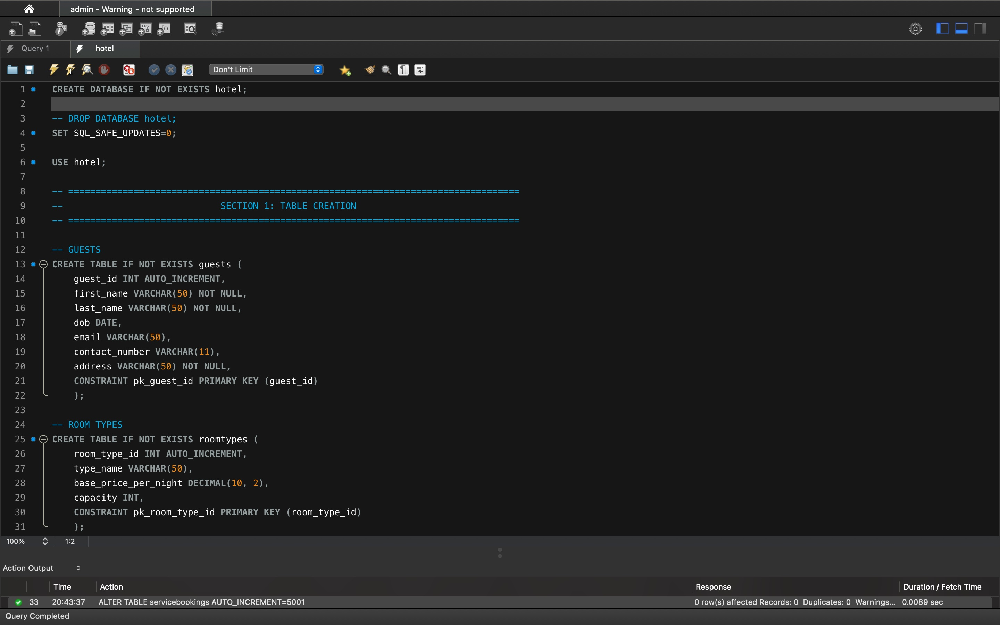

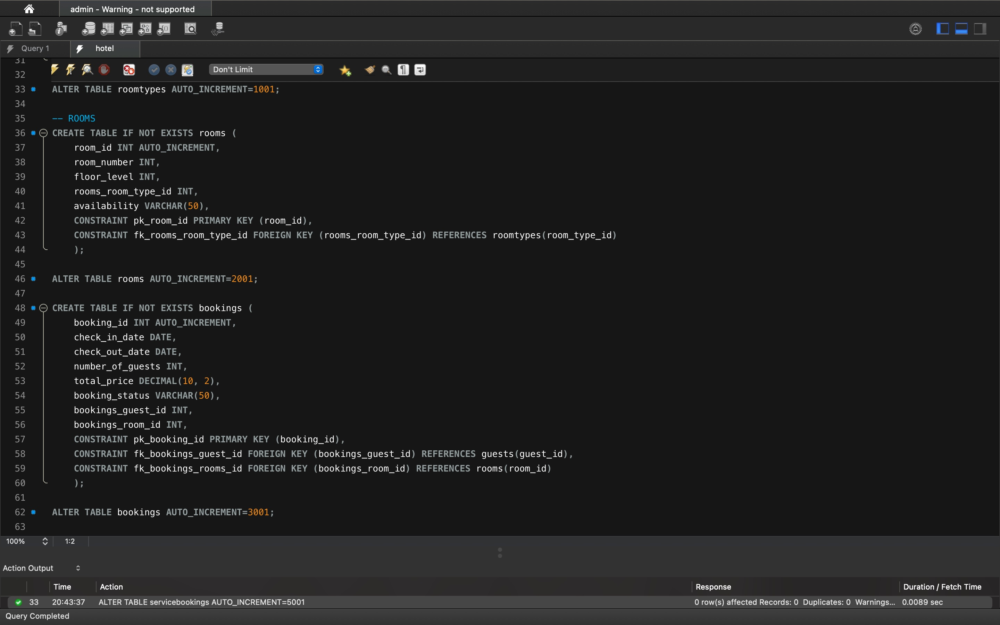

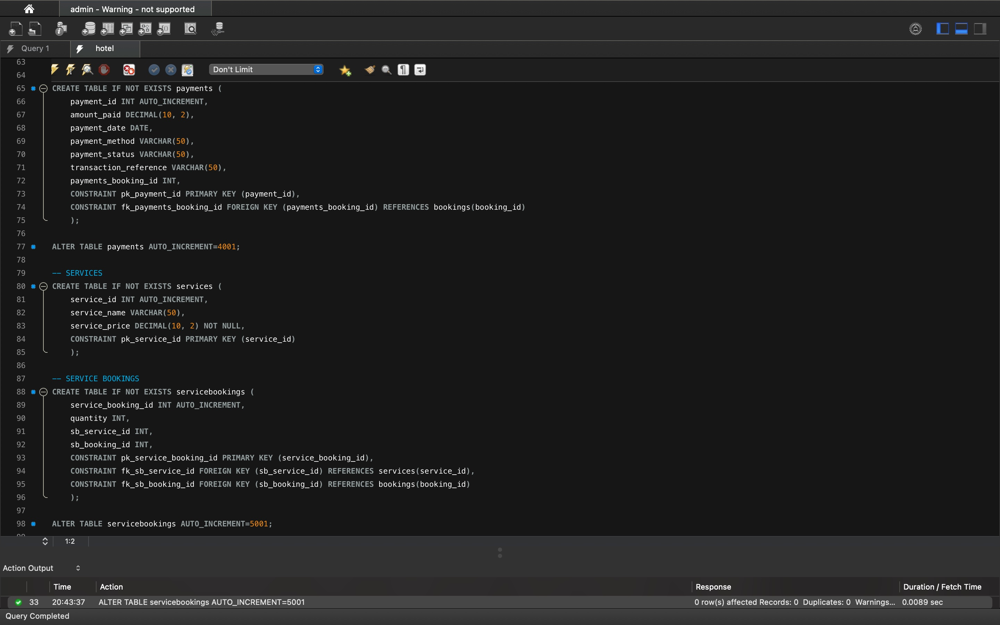

These screenshots above show the SQL code for creating my database and my tables.

A really useful SQL attribute I utilised was `AUTO_INCREMENT` which I assigned to all the columns containing the ids. It meant that any values inserted into the tables would automatically be assigned a new unique id, removing one input that had to be obtained from the user.

Another benefit was that I was able to set the beginning of the `AUTO_INCREMENT` to whatever value I wanted. This allowed me to differentiate the ids between the tables. So instead of all the tables ids incrementing from 1, I was able to set them to 1001, 2001, 3001, 4001 and 5001.

I assigned `NOT NULL` to the columns I definitely wanted information for. I also made sure to assign my primary and foreign key constraints to link the necessary tables.

Upon creating the tables, I made sure they were normalised so I would not run into dependency issues later down the line.

Initially, my `room` and `roomtypes` table were combined, but through normalisation, they were separated.

### Section 2: Value Insertion

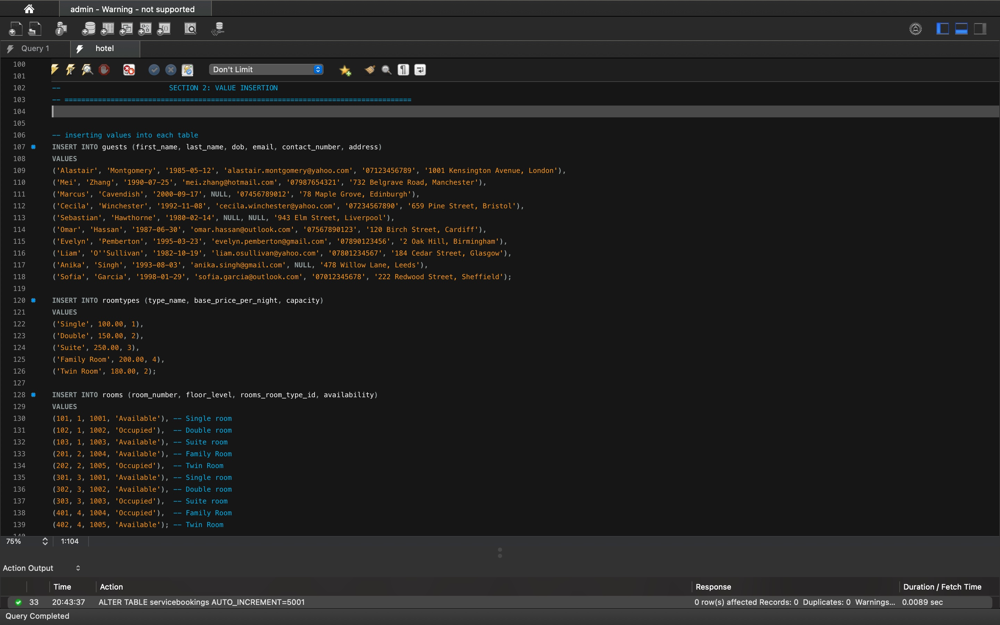

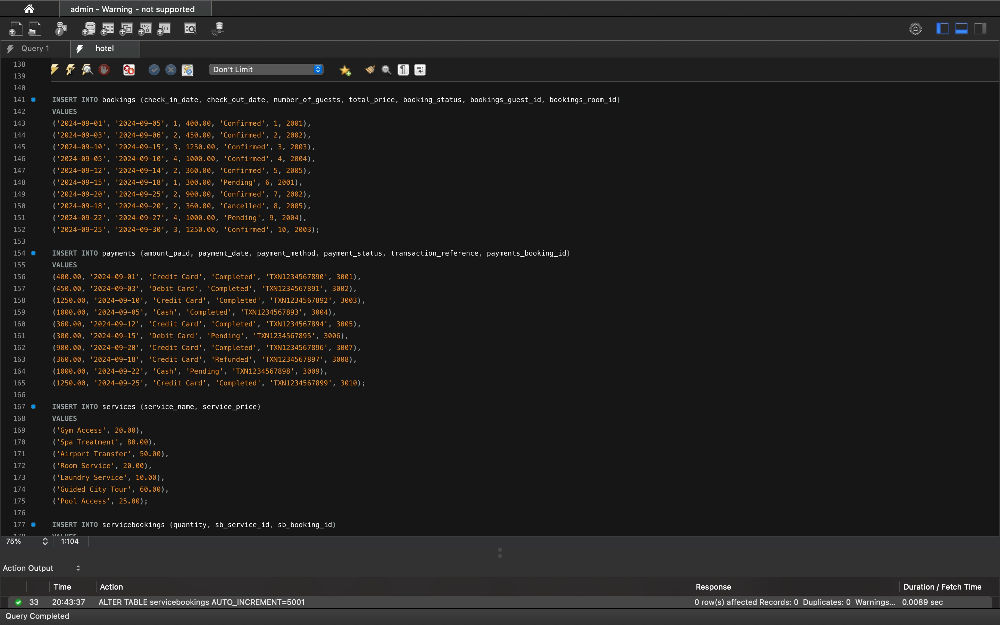

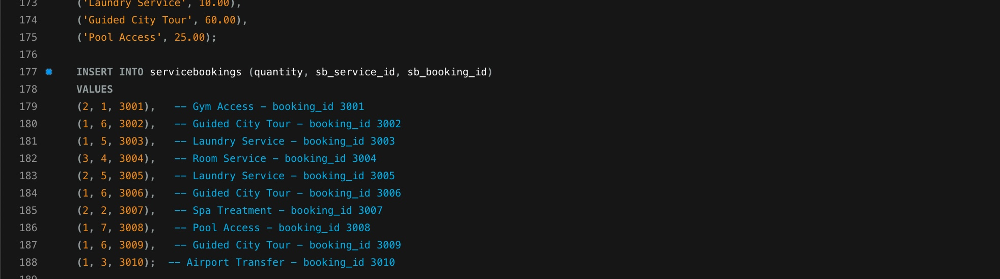

It was useful to leave comments to help quickly identify the information in some of the tables later down the line.

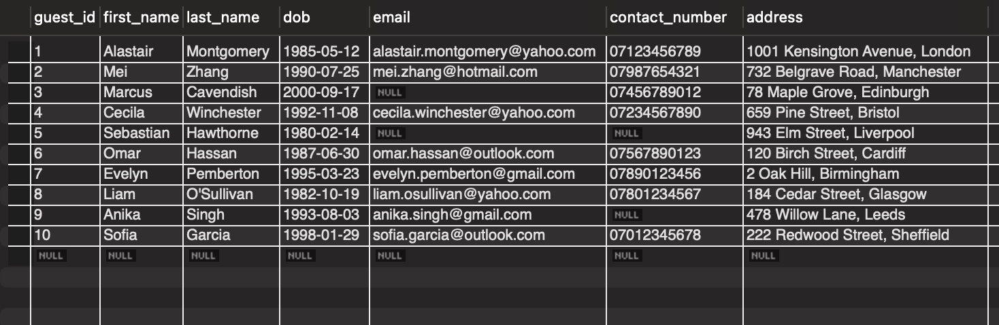

This is an example of one of my tables `guests` after running the statement `SELECT * FROM guests;`.

As expected, the `guest_id` column has the unique values inserted and assigned to each row. All columns are filled as expected and there are some `NULL` values in the columns which were not defined as `NOT NULL`.

### Section 3: Querying the Database

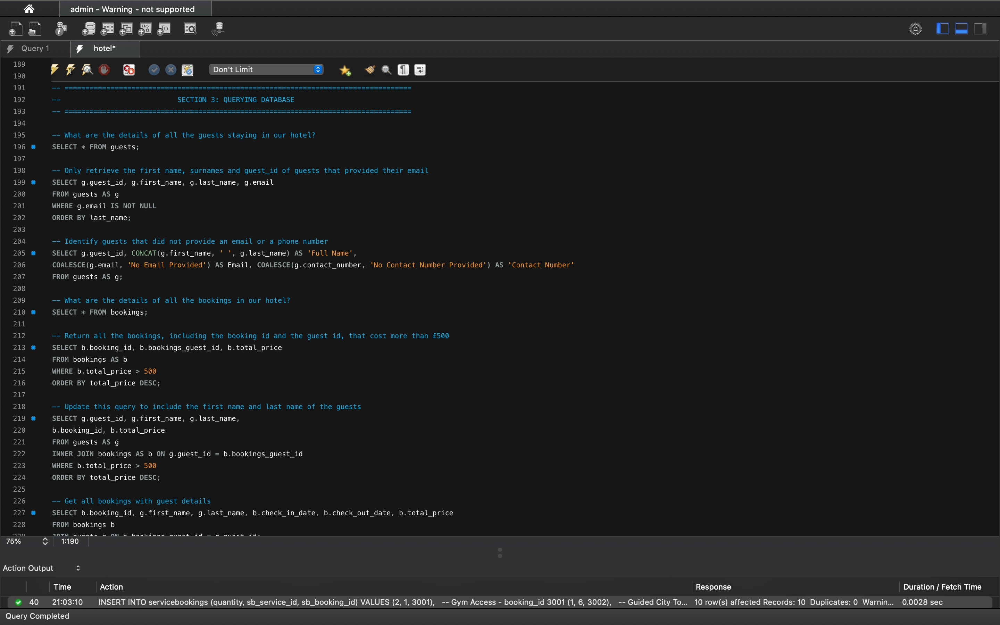

I was able to experiment with the database by running different queries to pull different types of data from my tables.

**Lines 205 to 207**
<br>
The `CONCAT` function allowed me to pull the separate columns of first_name and last_name, and concatenate them to produce a more prsentable column name. (i.e. a concatenated string). The `COALESCE` function allowed me quickly identify the `NULL` values and return the aliases in the respective cell blocks.

Query Output:

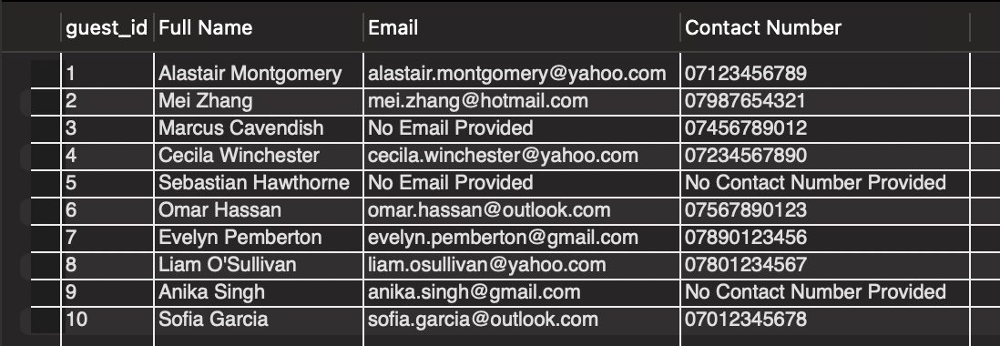


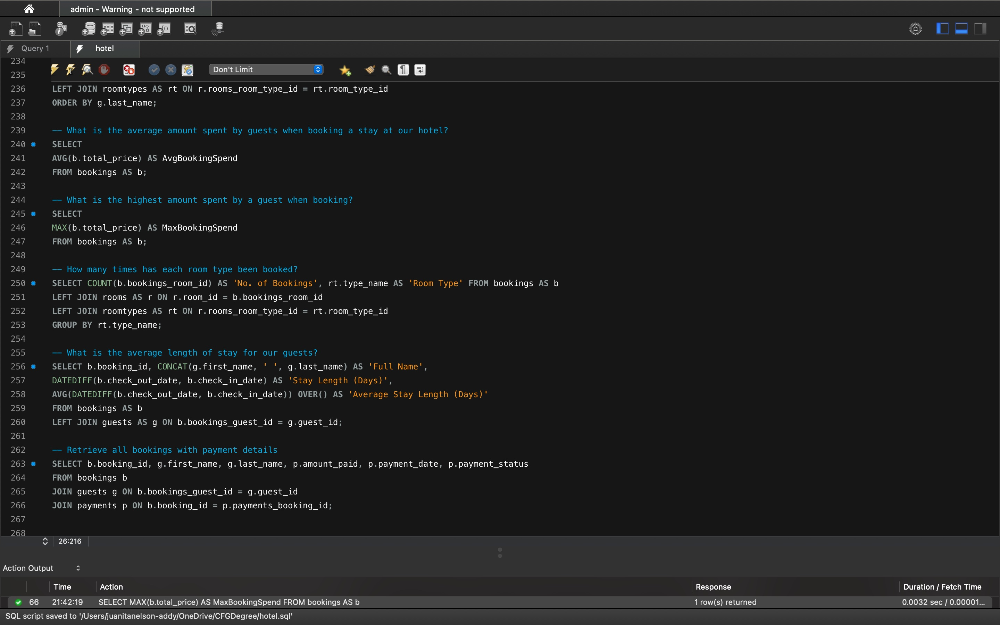

**Lines 255 to 260**
<br>
Using aggregate functions allowed me to work out the length of stay per guest, and the average length of stay across all guests.
- I used the `CONCAT()` function frequently to display the guest's full names more attractively.
- The `DATEDIFF()` function calculates the interval between two given dates, in this case the checkout date - the check in date.
- Then I used the `AVG()` function, alongside the `OVER()` window function to calculate the average interval across all bookings in the next column.

Query Output:
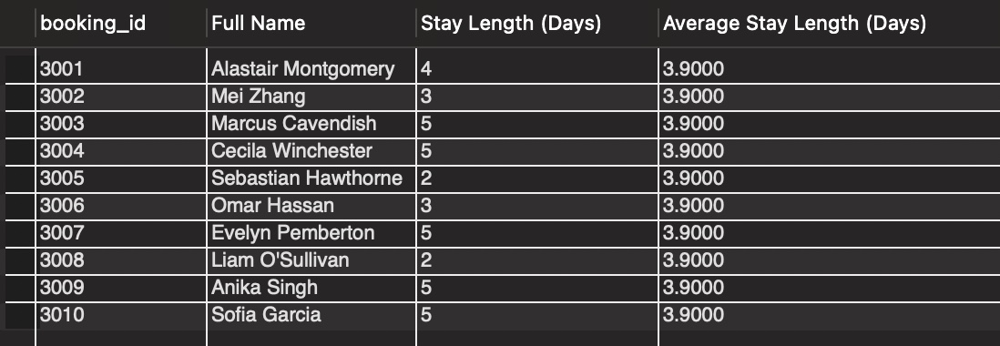

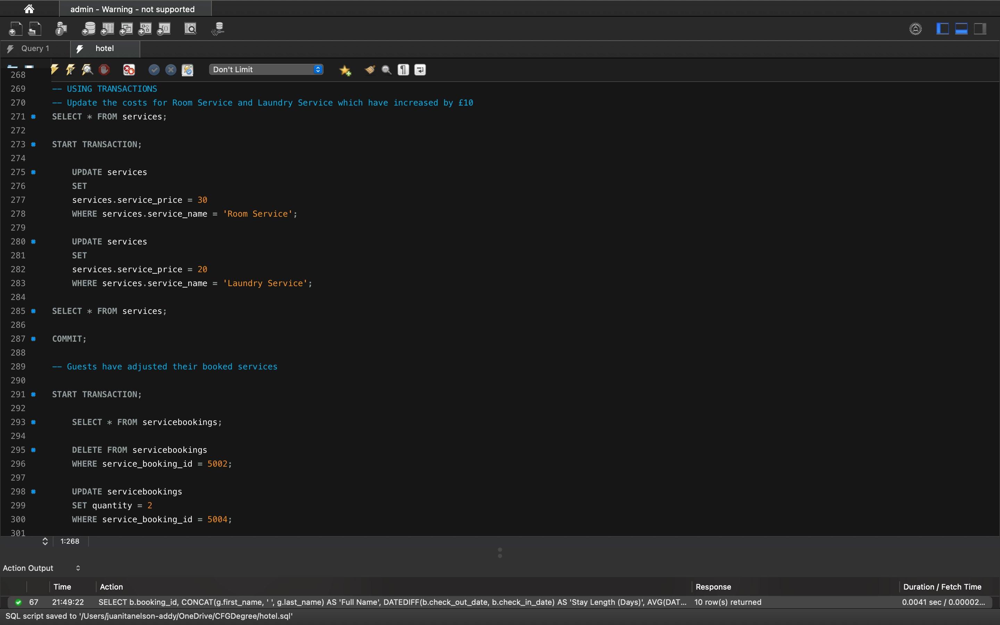


When it came to updating, modifying and deleting parts of my tables, using transactions became really useful. I was able to 'preview' the changes I wanted to make, before officially commiting them to my database.

Initial table:
<br>
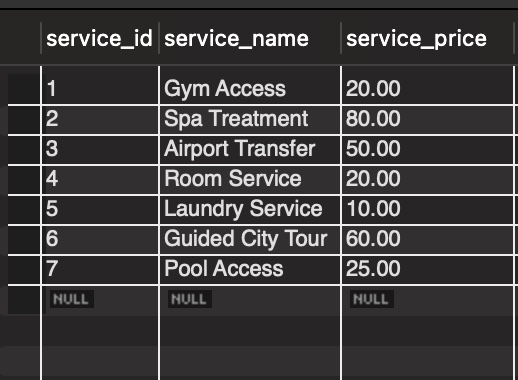

<br>

During transaction:
<br>
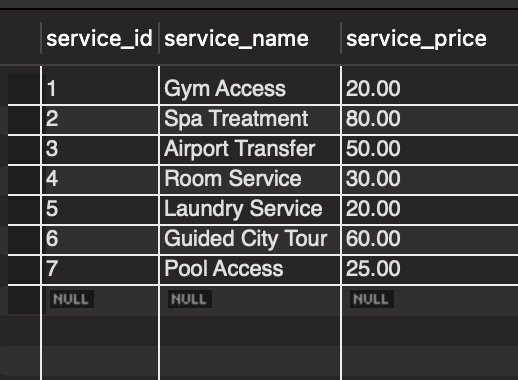

<br>

As you can see, the values for Room Service and Laundry successfully changed (increased by £10), so I was able to run the `COMMIT;` statement. If the wrong values had been modified, then I would have run the `ROLLBACK;` statement to reverse the changes.

The second transaction query does a similar thing, but there is a mixture of `UPDATE` and `DELETE` commands used. The same occurs, where the changes are successful, so I am able to commit the changes.

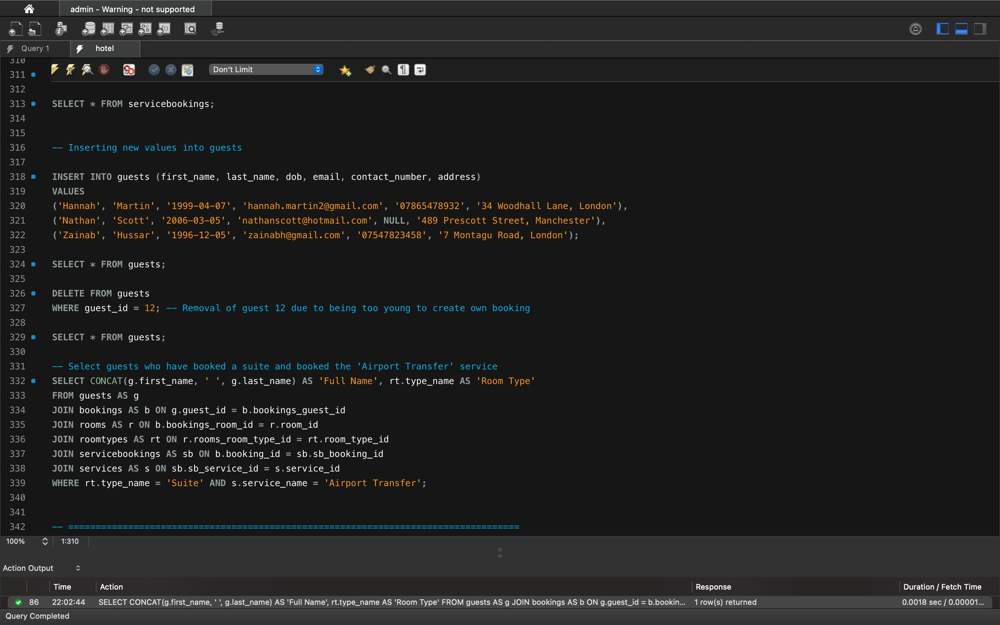

### Section 4: Stored Procedures

Stored procedures became my favourite things when working on this assignment because they helped make my database run a lot more efficiently.
I was able to create stored procedures for the insertion of new values into the majority of my tables to help streamline that process a little better.

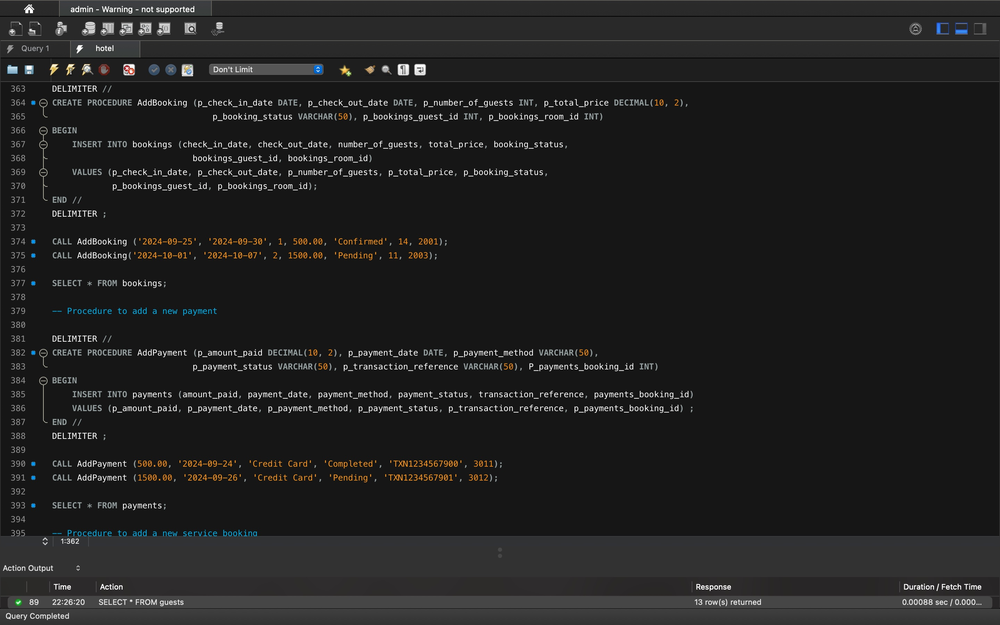

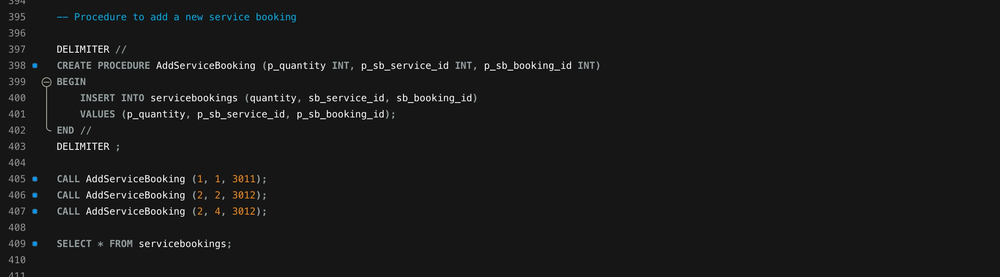

Initally, the procedure input variables were identical to the table column names, but I kept running into issues due to the ambiguity in the names. So I made sure to assign 'p_' at the beginning of the procedure input variable names to keep them unique and distinguishable.

In the screenshots above, you can see that I trialled the procedures by inserting new values into the tables linked to the new guests that I had added to the tables during my earlier querying. The tables now look pretty different from where we started.

Query Output:
<br>
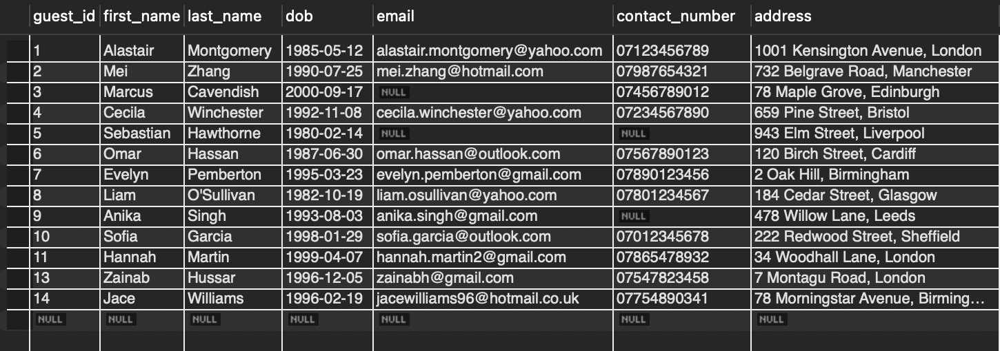

The final part of my SQL script was the most different challenge. I was aware that the `total_price` in the bookings table only accounted for the guest's total costs for the rooms, but not for any services they may have booked.

So I wanted to adjust all the values using logic and automation rather than manually.

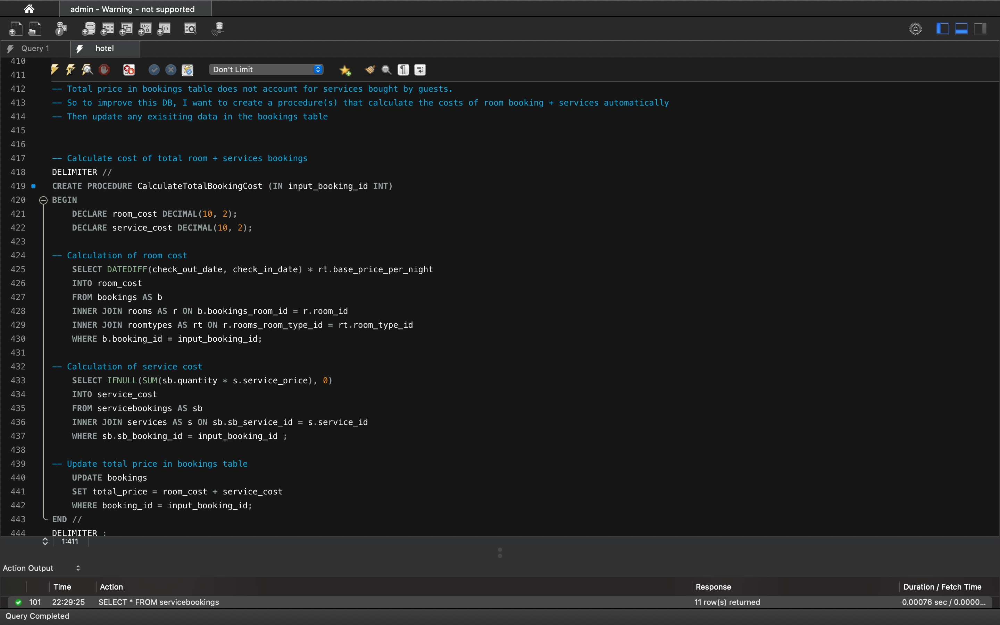

I broke down the procedure creation into sections to make it more manageable.

I needed to calculate the new total cost by adding the room cost + service costs together.
- Creating the procedure, I assigned the input to be the `booking_id` that needed its totals calculated
- `room_cost` was calculated by the length of stay multiplied by the price of the room type booked. The joins on bookings, rooms and room types allowed for the respective information to be pulled using the booking_id that is inputted.
- A similar thing is done for `service_cost`. The `IFNULL` function makes it so that if the `booking_id` inserted has not booked nay services, then the `service_cost` is 0.
- The final section updates the `total_price` in the `bookings` table with the newly calculated total costs where the `booking_id` in that table, matches the one given to the stored procedure.

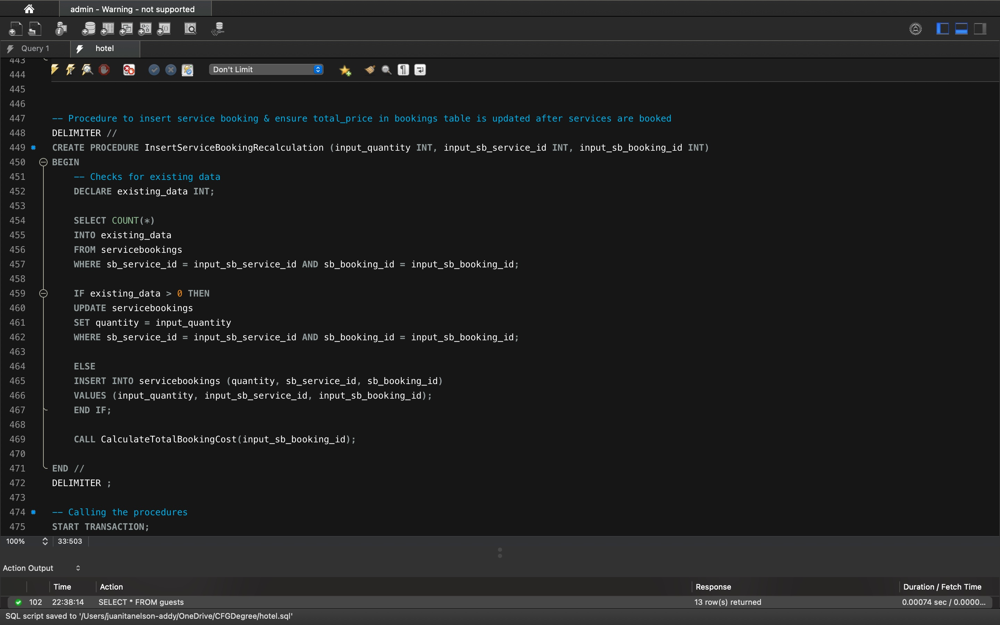

The next procedure's aim is insert a new service booking and recalculate and update the `total_price` in the `bookings` table after a service is booked.

- When I first created the procedure, I didn't include the check option, so it would add the data below exisiting data, which was producing duplicate data with new unique ids.
So, I realised that I would first have to do a check to see whether any of the matching data matched the ids that were provided by the user, and store this in the variable `existing_data`. If a matching record exists, then it updates the existing data.
- If not, it adds a new row into `servicebookings` table with the input details provided.
- Then once that is complete, the procedure calls on the `CalculateTotalBookingCost` procedure, to recalculate the totwal cost of the booking, and accounts for changes made to the services associated with the booking.




To take this procedure to the next level, I would create a trigger to automatically make these changes, so that it does have to continuously be done manually.

So to enact these changes, I started a transaction to preview the changes first. Tak enote of the `total_price` column.

Initial table:
<br>
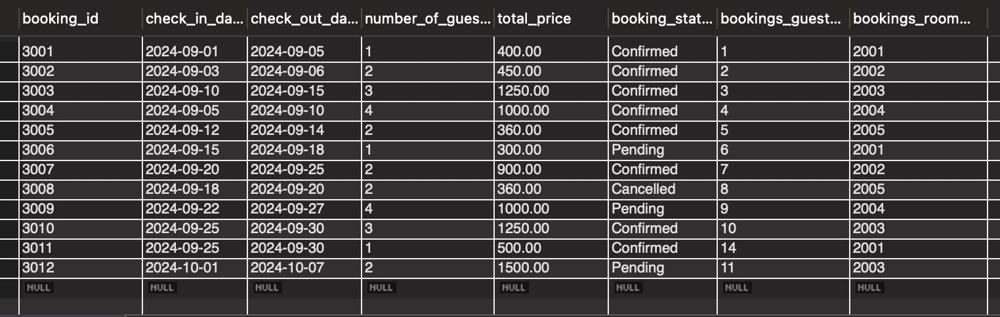

During transaction:
<br>
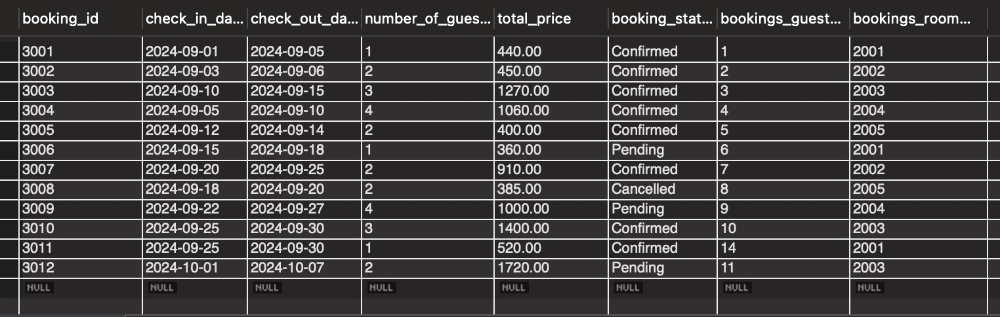

As you can see from the screenshots, the changes in the table have been made to account for the services booked by each guest.

To check this was correct, I checked the `servicebookings` table and cross-referenced.
- For example, `booking_id 3002` did not purchase any service add-ons, so their `total_price` was unchanging.
- However, `booking_id 3001` purchased the 'Gym Access' service valued at '£20' with a quantity of 2. Therefore adding £40 to their total, which is demonstrated in the second screenshot.

The transaction was success and thus committed.

Since I had created procedures that helped streamline the `AddBooking` procedure, I wanted to update it to call the `CalculateTotalBookingCost` procedure so that when guests book and purchase service additions when booking, it can be automatically added.

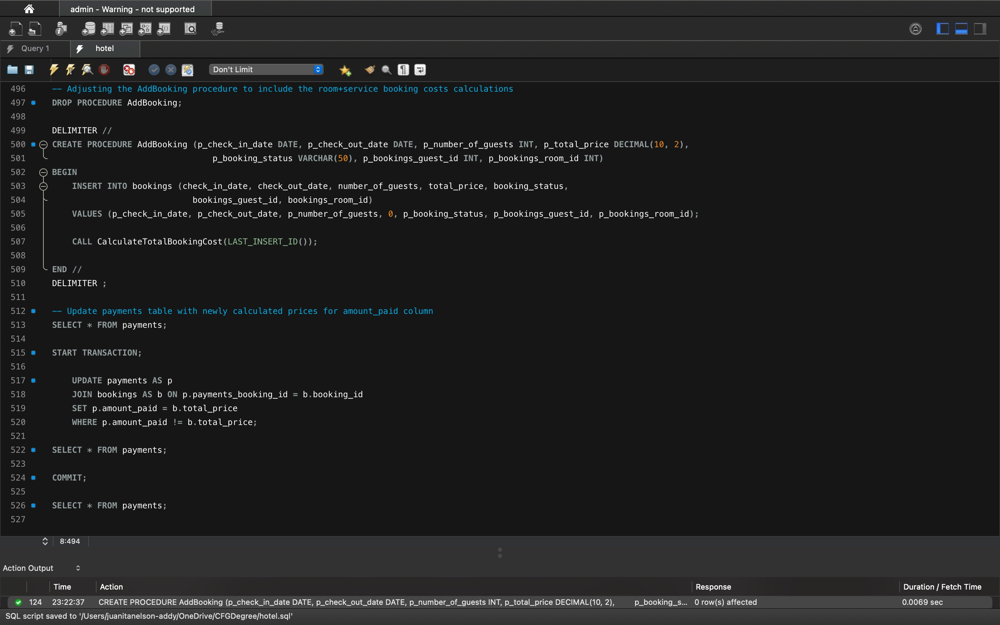


A downside to this is that it does not directly account for services purchased _during_ the guests' stay. It only focuses on the _intial_ booking. Therefore, to take this database further I could either change my procedures to factor this in, or potentially create an trigger that automatically updates the `total_price` in the `bookings` table any time a new service is added tot he `servicebookings` table.


Finally, since the `total_price` had changed, it meant that the recorded `amount_paid` values in the `payments` table needed to be updated. So from **lines 515 to 524** those changes are made within the transaction.

Initial table:
<br>
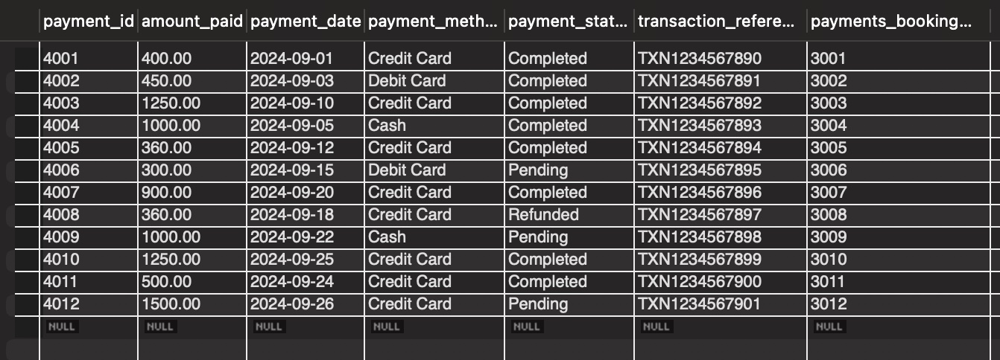

Updated table:
<br>
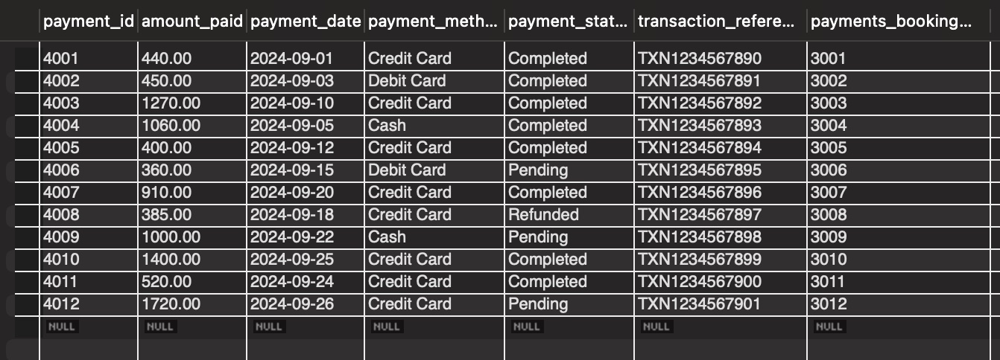

I have many ideas for this database that would help streamline its processes further.
- For instance, triggers for update the room availability in the `rooms` table when a new booking was inserted, or even triggers to change the payment status from 'Pending' to 'Completed' when the transaction was fully complete.
- The transaction references were stored as strings, but I would change them to the `INT` datatype so they could also have the `AUTO_INCREMENT` feature, to make reduce the input required by the user even further.
- When a new booking is added into the `bookings` table, perhaps it would take record of the `CURRENT_DATE()` rather than the user having into input it in manually.
- Creating more stored procedures to help better improve the automation of new table insertions and cost calculations
- Potentially add customer discounts/ premiums based on services purchased or length of stay
- Add indexes to the frequently used tables/ columns/ joins for faster queries
- Creating views to look at certain tables in detail e.g. hotel income/ revenue per month